# Análise Exploratória dos Dados

## Índice

- [Link para retornar ao notebook principal](#retornar-para-notebook-principal---mainipynb)
- [Importando bibliotecas e pacotes](#importando-bibliotecas-e-pacotes)
- [Importando datasets](#importando-datasets)
- [Breve apresentação dos dados](#breve-apresentacao-dos-dados)
- [Realizando a análise exploratória](#analise-exploratoria-dos-dados)

## Retornar para notebook principal - main.ipynb

[Link para notebook principal](./main.ipynb)

## Importando bibliotecas e pacotes

In [1]:
from utils.alterar_dataset import deletar_valores_absurdos, preencher_valores_faltantes_linha
from matplotlib import pyplot as plt
import pymannkendall as mk
import seaborn as sns
import pandas as pd
import numpy as np

## Importando datasets

In [2]:
df_funcao_renal = pd.read_csv("../databases/raw/InputFuncaoRenal.csv", sep = ",", index_col = "subject_id")
df_dieta_grupos = pd.read_csv("../databases/raw/dva_dieta_grupos.csv", sep = ",", index_col = "subject_id")
df_perfil_hepatico = pd.read_csv("../databases/raw/InputPerfilHepatico.csv", sep = ",", index_col = "subject_id")
df_ureia_pivoteado_7_dias = pd.read_csv("../databases/processed/ureia_pivoted.csv", sep = ",", index_col = "subject_id")
df_creatinina_pivoteado_7_dias = pd.read_csv("../databases/processed/creatinina_pivoted.csv", sep = ",", index_col = "subject_id")

## Breve apresentacao dos dados

### DATASET Funcao Renal

In [3]:
df_funcao_renal.sample(10)

,high_urea_days,high_creatinine_days
subject_id,,
17489583,1,4
18588532,0,0
10378026,0,1
17697261,1,2
19036718,4,4
10980113,0,2
15418459,0,2
15696359,0,0
14282911,0,2


In [4]:
df_funcao_renal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7493 entries, 18135694 to 12767768
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   high_urea_days        7493 non-null   int64
 1   high_creatinine_days  7493 non-null   int64
dtypes: int64(2)
memory usage: 175.6 KB


### DATASET Dieta Grupos

In [5]:
df_dieta_grupos.sample(10)

,firstnutrition,noramaxday1,noramaxday2,noramaxday3,noramaxday4,noramaxday5,noramaxday6,noramaxday7,vasoday1,vasoday2,...,vasoday5,vasoday6,vasoday7,kcalkgday1,kcalkgday2,kcalkgday3,kcalkgday4,kcalkgday5,kcalkgday6,kcalkgday7
subject_id,,,,,,,,,,,,,,,,,,,,,
13671107,1,0,0,0,0,0,0,0,0,0,...,0,0,0,2.114,13.437,29.201,1.980,24.706,19.352,33.005
10441044,1,0,1,1,1,1,1,1,0,0,...,0,0,0,11.078,24.185,28.810,29.273,14.697,20.362,26.350
12457358,1,1,1,0,0,0,0,0,0,0,...,0,0,0,7.638,12.115,18.770,33.794,32.261,24.285,25.028
15442180,1,1,1,1,0,0,0,0,0,0,...,0,0,0,3.142,8.623,23.917,29.692,31.814,17.229,31.497
11309053,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0.235,0.939,2.624,1.340,0.704,0.235,0.000
18807029,1,0,0,0,0,0,0,0,0,0,...,0,0,0,5.221,8.252,2.463,0.668,0.124,0.051,0.000
14910393,1,0,0,0,0,0,0,0,0,0,...,0,0,0,6.286,9.797,7.205,6.391,10.058,14.151,20.068
13021546,1,0,0,0,0,0,0,0,0,0,...,0,0,0,7.473,8.998,7.568,4.944,22.727,32.724,29.862
14360663,1,1,0,0,0,0,0,0,0,0,...,0,0,0,6.843,1.506,1.369,1.232,0.000,0.000,0.000


In [6]:
df_dieta_grupos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3316 entries, 12306709 to 12748404
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   firstnutrition  3316 non-null   int64  
 1   noramaxday1     3316 non-null   int64  
 2   noramaxday2     3316 non-null   int64  
 3   noramaxday3     3316 non-null   int64  
 4   noramaxday4     3316 non-null   int64  
 5   noramaxday5     3316 non-null   int64  
 6   noramaxday6     3316 non-null   int64  
 7   noramaxday7     3316 non-null   int64  
 8   vasoday1        3316 non-null   int64  
 9   vasoday2        3316 non-null   int64  
 10  vasoday3        3316 non-null   int64  
 11  vasoday4        3316 non-null   int64  
 12  vasoday5        3316 non-null   int64  
 13  vasoday6        3316 non-null   int64  
 14  vasoday7        3316 non-null   int64  
 15  kcalkgday1      3316 non-null   float64
 16  kcalkgday2      3316 non-null   float64
 17  kcalkgday3      3316 non-nu

### DATASET Perfil Hepatico

In [7]:
df_perfil_hepatico.sample(10)

,max_alkaline,max_alt,max_ast,high_bilirubins_days,high_triglycerides_days
subject_id,,,,,
13909927,0,0,0,0,0
16302490,0,0,0,0,0
16211926,0,0,0,0,0
11128977,0,2,3,0,0
14124506,1,2,2,0,1
13985157,0,1,2,0,0
13687562,0,0,0,0,0
15481731,0,0,0,0,2
19532004,0,0,0,0,0


In [8]:
df_perfil_hepatico.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7493 entries, 18135694 to 12767768
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   max_alkaline             7493 non-null   int64
 1   max_alt                  7493 non-null   int64
 2   max_ast                  7493 non-null   int64
 3   high_bilirubins_days     7493 non-null   int64
 4   high_triglycerides_days  7493 non-null   int64
dtypes: int64(5)
memory usage: 351.2 KB


### DATASET ureia pivoteada - 7 dias

In [9]:
df_ureia_pivoteado_7_dias.sample(10)

,ureia_dia_1,ureia_dia_2,ureia_dia_3,ureia_dia_4,ureia_dia_5,ureia_dia_6,ureia_dia_7
subject_id,,,,,,,
11741747,22.0,10.0,5.0,6.0,6.0,7.0,10.0
18500092,39.0,45.0,47.0,49.0,66.0,40.0,46.0
18552263,21.0,13.0,10.0,12.0,11.0,10.0,12.0
18425923,18.0,22.0,20.0,17.0,15.0,17.0,17.0
17237386,19.0,19.0,21.0,19.0,21.0,23.0,21.0
17904720,43.0,51.0,NaN,52.0,44.0,40.0,39.0
17484283,NaN,10.0,9.0,9.0,8.0,10.0,NaN
19802563,96.0,106.0,116.0,124.0,131.0,120.0,NaN
10463927,16.0,23.0,27.0,34.0,50.0,49.0,47.0


In [10]:
df_ureia_pivoteado_7_dias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3315 entries, 10001884 to 19999442
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ureia_dia_1  3297 non-null   float64
 1   ureia_dia_2  3277 non-null   float64
 2   ureia_dia_3  3281 non-null   float64
 3   ureia_dia_4  3267 non-null   float64
 4   ureia_dia_5  3262 non-null   float64
 5   ureia_dia_6  3242 non-null   float64
 6   ureia_dia_7  3082 non-null   float64
dtypes: float64(7)
memory usage: 207.2 KB


### DATASET creatinina pivoteada - 7 dias

In [11]:
df_creatinina_pivoteado_7_dias.sample(10)

,creatinina_dia_1,creatinina_dia_2,creatinina_dia_3,creatinina_dia_4,creatinina_dia_5,creatinina_dia_6,creatinina_dia_7
subject_id,,,,,,,
12091229,1.0,1.0,0.9,0.9,1.1,1.1,0.9
15228427,0.8,0.8,0.8,0.8,0.9,1.6,1.8
11387173,1.1,1.1,1.1,1.0,1.0,0.9,0.9
19741896,0.9,1.1,1.1,0.9,0.6,0.5,0.5
11677053,0.9,1.1,1.1,0.8,0.8,0.8,0.8
12616482,1.0,1.1,1.0,1.0,0.9,0.9,1.3
10476303,3.8,4.3,4.7,5.3,5.1,5.5,5.4
18622276,0.6,0.6,0.5,0.6,0.6,0.6,0.4
17828523,0.7,0.5,0.5,0.5,0.7,1.3,1.3


In [12]:
df_creatinina_pivoteado_7_dias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3315 entries, 10001884 to 19999442
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   creatinina_dia_1  3298 non-null   float64
 1   creatinina_dia_2  3275 non-null   float64
 2   creatinina_dia_3  3282 non-null   float64
 3   creatinina_dia_4  3267 non-null   float64
 4   creatinina_dia_5  3262 non-null   float64
 5   creatinina_dia_6  3241 non-null   float64
 6   creatinina_dia_7  3081 non-null   float64
dtypes: float64(7)
memory usage: 207.2 KB


## Analise Exploratoria dos Dados

### DATASET Funcao Renal

#### Colunas

In [13]:
df_funcao_renal.columns

Index(['high_urea_days', 'high_creatinine_days'], dtype='object')

#### Valores únicos das colunas

##### Coluna: "high_urea_days"

In [14]:
df_funcao_renal["high_urea_days"].unique()

array([0, 4, 3, 2, 1])

##### Coluna: "high_creatinine_days"

In [15]:
df_funcao_renal["high_creatinine_days"].unique()

array([0, 4, 1, 2, 3])

#### Quantidade de cada um dos valores únicos das colunas

##### Coluna: "high_urea_days"

In [16]:
df_funcao_renal["high_urea_days"].value_counts()

high_urea_days
0    5273
4     605
2     589
1     555
3     471
Name: count, dtype: int64

##### Coluna: "high_urea_days"

In [17]:
df_funcao_renal["high_creatinine_days"].value_counts()

high_creatinine_days
0    3908
4    1763
1     666
3     593
2     563
Name: count, dtype: int64

Acima, podemos ver que:
- Ambas colunas tem valores que variam de 0 a 4;
- Em ambas colunas, o valor `0` é o mais recorrente;
- Em ambas colunas, o valor `3` é o menos recorrente;
- Ambas colunas apresentam quantidades de valores na mesma ordem decrescente, isto é:
    - O valor `0` é o que mais apresenta dados;
    - Logo em seguida o valor `4`;
    - O valor `2`;
    - O valor `1`;
    - E por fim o valor `3` com a menor quantidade de dados.

#### Quantidade de valores nulos das colunas

In [18]:
colunas = df_funcao_renal.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores nulos:", df_funcao_renal[coluna].isna().sum(), end = "\n\n")

Coluna [ high_urea_days ]
--> Valores nulos: 0

Coluna [ high_creatinine_days ]
--> Valores nulos: 0



### DATASET Dieta Grupos

#### Colunas

In [19]:
df_dieta_grupos.columns

Index(['firstnutrition', 'noramaxday1', 'noramaxday2', 'noramaxday3',
       'noramaxday4', 'noramaxday5', 'noramaxday6', 'noramaxday7', 'vasoday1',
       'vasoday2', 'vasoday3', 'vasoday4', 'vasoday5', 'vasoday6', 'vasoday7',
       'kcalkgday1', 'kcalkgday2', 'kcalkgday3', 'kcalkgday4', 'kcalkgday5',
       'kcalkgday6', 'kcalkgday7'],
      dtype='object')

#### Valores únicos das colunas

In [20]:
colunas = df_dieta_grupos.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores únicos:", df_dieta_grupos[coluna].unique())

Coluna [ firstnutrition ]
--> Valores únicos: [1 0 3 2]
Coluna [ noramaxday1 ]
--> Valores únicos: [2 0 1 3]
Coluna [ noramaxday2 ]
--> Valores únicos: [0 1 2 3]
Coluna [ noramaxday3 ]
--> Valores únicos: [0 1 2 3]
Coluna [ noramaxday4 ]
--> Valores únicos: [0 1 2 3]
Coluna [ noramaxday5 ]
--> Valores únicos: [0 1 2 3]
Coluna [ noramaxday6 ]
--> Valores únicos: [0 2 1 3]
Coluna [ noramaxday7 ]
--> Valores únicos: [0 1 2 3]
Coluna [ vasoday1 ]
--> Valores únicos: [1 0]
Coluna [ vasoday2 ]
--> Valores únicos: [1 0]
Coluna [ vasoday3 ]
--> Valores únicos: [0 1]
Coluna [ vasoday4 ]
--> Valores únicos: [0 1]
Coluna [ vasoday5 ]
--> Valores únicos: [0 1]
Coluna [ vasoday6 ]
--> Valores únicos: [0 1]
Coluna [ vasoday7 ]
--> Valores únicos: [0 1]
Coluna [ kcalkgday1 ]
--> Valores únicos: [6.98  4.348 8.047 ... 2.079 0.734 5.212]
Coluna [ kcalkgday2 ]
--> Valores únicos: [ 4.751  0.168  5.143 ... 16.414  4.111  6.98 ]
Coluna [ kcalkgday3 ]
--> Valores únicos: [ 3.059  0.337  5.74  ...  5.19   3

#### Quantidade de valores nulos das colunas

In [21]:
colunas = df_dieta_grupos.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores nulos:", df_dieta_grupos[coluna].isna().sum(), end = "\n\n")

Coluna [ firstnutrition ]
--> Valores nulos: 0

Coluna [ noramaxday1 ]
--> Valores nulos: 0

Coluna [ noramaxday2 ]
--> Valores nulos: 0

Coluna [ noramaxday3 ]
--> Valores nulos: 0

Coluna [ noramaxday4 ]
--> Valores nulos: 0

Coluna [ noramaxday5 ]
--> Valores nulos: 0

Coluna [ noramaxday6 ]
--> Valores nulos: 0

Coluna [ noramaxday7 ]
--> Valores nulos: 0

Coluna [ vasoday1 ]
--> Valores nulos: 0

Coluna [ vasoday2 ]
--> Valores nulos: 0

Coluna [ vasoday3 ]
--> Valores nulos: 0

Coluna [ vasoday4 ]
--> Valores nulos: 0

Coluna [ vasoday5 ]
--> Valores nulos: 0

Coluna [ vasoday6 ]
--> Valores nulos: 0

Coluna [ vasoday7 ]
--> Valores nulos: 0

Coluna [ kcalkgday1 ]
--> Valores nulos: 0

Coluna [ kcalkgday2 ]
--> Valores nulos: 0

Coluna [ kcalkgday3 ]
--> Valores nulos: 0

Coluna [ kcalkgday4 ]
--> Valores nulos: 0

Coluna [ kcalkgday5 ]
--> Valores nulos: 0

Coluna [ kcalkgday6 ]
--> Valores nulos: 0

Coluna [ kcalkgday7 ]
--> Valores nulos: 0



### DATASET Perfil Hepatico

#### Colunas

In [22]:
df_perfil_hepatico.columns

Index(['max_alkaline', 'max_alt', 'max_ast', 'high_bilirubins_days',
       'high_triglycerides_days'],
      dtype='object')

#### Valores únicos das colunas

In [23]:
colunas = df_perfil_hepatico.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores únicos:", df_perfil_hepatico[coluna].unique())

Coluna [ max_alkaline ]
--> Valores únicos: [0 1 2 3]
Coluna [ max_alt ]
--> Valores únicos: [0 1 2 3]
Coluna [ max_ast ]
--> Valores únicos: [0 1 2 3]
Coluna [ high_bilirubins_days ]
--> Valores únicos: [0 1 4 3 2]
Coluna [ high_triglycerides_days ]
--> Valores únicos: [0 1 3 2 4]


#### Quantidade de valores nulos das colunas

In [24]:
colunas = df_perfil_hepatico.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores nulos:", df_perfil_hepatico[coluna].isna().sum(), end = "\n\n")

Coluna [ max_alkaline ]
--> Valores nulos: 0

Coluna [ max_alt ]
--> Valores nulos: 0

Coluna [ max_ast ]
--> Valores nulos: 0

Coluna [ high_bilirubins_days ]
--> Valores nulos: 0

Coluna [ high_triglycerides_days ]
--> Valores nulos: 0



### DATASET Ureia pivoteado - 7 dias

#### Colunas

In [25]:
df_ureia_pivoteado_7_dias.columns

Index(['ureia_dia_1', 'ureia_dia_2', 'ureia_dia_3', 'ureia_dia_4',
       'ureia_dia_5', 'ureia_dia_6', 'ureia_dia_7'],
      dtype='object')

#### Quantidade de valores nulos das colunas

In [26]:
colunas = df_ureia_pivoteado_7_dias.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores nulos:", df_ureia_pivoteado_7_dias[coluna].isna().sum(), end = "\n\n")

Coluna [ ureia_dia_1 ]
--> Valores nulos: 18

Coluna [ ureia_dia_2 ]
--> Valores nulos: 38

Coluna [ ureia_dia_3 ]
--> Valores nulos: 34

Coluna [ ureia_dia_4 ]
--> Valores nulos: 48

Coluna [ ureia_dia_5 ]
--> Valores nulos: 53

Coluna [ ureia_dia_6 ]
--> Valores nulos: 73

Coluna [ ureia_dia_7 ]
--> Valores nulos: 233



### DATASET Creatinia pivoteado - 7 dias

#### Colunas

In [27]:
df_creatinina_pivoteado_7_dias.columns

Index(['creatinina_dia_1', 'creatinina_dia_2', 'creatinina_dia_3',
       'creatinina_dia_4', 'creatinina_dia_5', 'creatinina_dia_6',
       'creatinina_dia_7'],
      dtype='object')

#### Quantidade de valores nulos das colunas

In [28]:
colunas = df_creatinina_pivoteado_7_dias.columns

for coluna in colunas:
    print("Coluna [", coluna, "]")
    print("--> Valores nulos:", df_creatinina_pivoteado_7_dias[coluna].isna().sum(), end = "\n\n")

Coluna [ creatinina_dia_1 ]
--> Valores nulos: 17

Coluna [ creatinina_dia_2 ]
--> Valores nulos: 40

Coluna [ creatinina_dia_3 ]
--> Valores nulos: 33

Coluna [ creatinina_dia_4 ]
--> Valores nulos: 48

Coluna [ creatinina_dia_5 ]
--> Valores nulos: 53

Coluna [ creatinina_dia_6 ]
--> Valores nulos: 74

Coluna [ creatinina_dia_7 ]
--> Valores nulos: 234



### Valores estatísticos

#### DATASET Funcao Renal

In [29]:
for coluna in df_funcao_renal.columns:
    print(f"Coluna {coluna}:\n================")
    print(f"Média: {df_funcao_renal[coluna].mean()}")
    print(f"Mediana: {df_funcao_renal[coluna].median()}")
    print(f"Desvio Padrão: {df_funcao_renal[coluna].std()}")
    print(f"Moda: {df_funcao_renal[coluna].mode()[0]}")
    print(f"Mínimo: {df_funcao_renal[coluna].min()}")
    print(f"Máximo: {df_funcao_renal[coluna].max()}", end = "\n================\n\n")

Coluna high_urea_days:
Média: 0.7428266381956493
Mediana: 0.0
Desvio Padrão: 1.3017415606552587
Moda: 0
Mínimo: 0
Máximo: 4

Coluna high_creatinine_days:
Média: 1.4177232083277727
Mediana: 0.0
Desvio Padrão: 1.690182636944063
Moda: 0
Mínimo: 0
Máximo: 4



#### DATASET Dieta Grupos

In [30]:
for coluna in df_dieta_grupos.columns:
    print(f"Coluna {coluna}:\n================")
    print(f"Média: {df_dieta_grupos[coluna].mean()}")
    print(f"Mediana: {df_dieta_grupos[coluna].median()}")
    print(f"Desvio Padrão: {df_dieta_grupos[coluna].std()}")
    print(f"Moda: {df_dieta_grupos[coluna].mode()[0]}")
    print(f"Mínimo: {df_dieta_grupos[coluna].min()}")
    print(f"Máximo: {df_dieta_grupos[coluna].max()}", end = "\n================\n\n")

Coluna firstnutrition:
Média: 1.0790108564535585
Mediana: 1.0
Desvio Padrão: 0.4048347168866972
Moda: 1
Mínimo: 0
Máximo: 3

Coluna noramaxday1:
Média: 0.502714113389626
Mediana: 0.0
Desvio Padrão: 0.8166767764288503
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday2:
Média: 0.4044028950542823
Mediana: 0.0
Desvio Padrão: 0.6909664287436411
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday3:
Média: 0.3398673100120627
Mediana: 0.0
Desvio Padrão: 0.6257350529140677
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday4:
Média: 0.2852834740651387
Mediana: 0.0
Desvio Padrão: 0.5697560626270378
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday5:
Média: 0.23974668275030156
Mediana: 0.0
Desvio Padrão: 0.533748345471598
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday6:
Média: 0.2147165259348613
Mediana: 0.0
Desvio Padrão: 0.5231076167897025
Moda: 0
Mínimo: 0
Máximo: 3

Coluna noramaxday7:
Média: 0.1957177322074789
Mediana: 0.0
Desvio Padrão: 0.5152220426007638
Moda: 0
Mínimo: 0
Máximo: 3

Coluna vasoday1:
Média

#### DATASET Perfil Hepatico

In [31]:
for coluna in df_perfil_hepatico.columns:
    print(f"Coluna {coluna}:\n================")
    print(f"Média: {df_perfil_hepatico[coluna].mean()}")
    print(f"Mediana: {df_perfil_hepatico[coluna].median()}")
    print(f"Desvio Padrão: {df_perfil_hepatico[coluna].std()}")
    print(f"Moda: {df_perfil_hepatico[coluna].mode()[0]}")
    print(f"Mínimo: {df_perfil_hepatico[coluna].min()}")
    print(f"Máximo: {df_perfil_hepatico[coluna].max()}", end = "\n================\n\n")

Coluna max_alkaline:
Média: 0.24089149873215002
Mediana: 0.0
Desvio Padrão: 0.5617490947807411
Moda: 0
Mínimo: 0
Máximo: 3

Coluna max_alt:
Média: 0.7102629120512478
Mediana: 0.0
Desvio Padrão: 1.074754021576933
Moda: 0
Mínimo: 0
Máximo: 3

Coluna max_ast:
Média: 0.9697050580541839
Mediana: 0.0
Desvio Padrão: 1.1608562211004336
Moda: 0
Mínimo: 0
Máximo: 3

Coluna high_bilirubins_days:
Média: 0.5866809021753637
Mediana: 0.0
Desvio Padrão: 1.2024706920980064
Moda: 0
Mínimo: 0
Máximo: 4

Coluna high_triglycerides_days:
Média: 0.15654610970238889
Mediana: 0.0
Desvio Padrão: 0.46663524669657125
Moda: 0
Mínimo: 0
Máximo: 4



#### DATASET Ureia pivoteado - 7 dias

In [32]:
for paciente in df_ureia_pivoteado_7_dias.index:
    print(f"paciente {paciente}:\n================")
    print(f"Média: {df_ureia_pivoteado_7_dias.loc[paciente, :].mean()}")
    print(f"Mediana: {df_ureia_pivoteado_7_dias.loc[paciente, :].median()}")
    print(f"Desvio Padrão: {df_ureia_pivoteado_7_dias.loc[paciente, :].std()}")
    print(f"Moda: {df_ureia_pivoteado_7_dias.loc[paciente, :].mode()[0]}")
    print(f"Mínimo: {df_ureia_pivoteado_7_dias.loc[paciente, :].min()}")
    print(f"Máximo: {df_ureia_pivoteado_7_dias.loc[paciente, :].max()}", end = "\n================\n\n")

paciente 10001884:
Média: 26.833333333333332
Mediana: 28.0
Desvio Padrão: 8.256310717667223
Moda: 14.0
Mínimo: 14.0
Máximo: 38.0

paciente 10004422:
Média: 18.5
Mediana: 18.5
Desvio Padrão: 3.9370039370059056
Moda: 13.0
Mínimo: 13.0
Máximo: 24.0

paciente 10004733:
Média: 34.714285714285715
Mediana: 37.0
Desvio Padrão: 7.250615737399727
Moda: 28.0
Mínimo: 26.0
Máximo: 44.0

paciente 10005606:
Média: 9.0
Mediana: 8.0
Desvio Padrão: 3.687817782917155
Moda: 6.0
Mínimo: 6.0
Máximo: 15.0

paciente 10010867:
Média: 6.428571428571429
Mediana: 6.0
Desvio Padrão: 1.618347187425374
Moda: 5.0
Mínimo: 5.0
Máximo: 9.0

paciente 10019777:
Média: 17.857142857142858
Mediana: 17.0
Desvio Padrão: 2.115700942049815
Moda: 16.0
Mínimo: 16.0
Máximo: 22.0

paciente 10020944:
Média: 24.285714285714285
Mediana: 22.0
Desvio Padrão: 5.37631490007439
Moda: 19.0
Mínimo: 19.0
Máximo: 34.0

paciente 10023486:
Média: 59.142857142857146
Mediana: 63.0
Desvio Padrão: 11.201615529743487
Moda: 42.0
Mínimo: 42.0
Máximo: 70

#### DATASET Creatinina pivoteado - 7 dias

In [33]:
for paciente in df_creatinina_pivoteado_7_dias.index:
    print(f"paciente {paciente}:\n================")
    print(f"Média: {df_creatinina_pivoteado_7_dias.loc[paciente, :].mean()}")
    print(f"Mediana: {df_creatinina_pivoteado_7_dias.loc[paciente, :].median()}")
    print(f"Desvio Padrão: {df_creatinina_pivoteado_7_dias.loc[paciente, :].std()}")
    print(f"Moda: {df_creatinina_pivoteado_7_dias.loc[paciente, :].mode()[0]}")
    print(f"Mínimo: {df_creatinina_pivoteado_7_dias.loc[paciente, :].min()}")
    print(f"Máximo: {df_creatinina_pivoteado_7_dias.loc[paciente, :].max()}", end = "\n================\n\n")

paciente 10001884:
Média: 0.8666666666666667
Mediana: 0.8500000000000001
Desvio Padrão: 0.30110906108363245
Moda: 0.5
Mínimo: 0.5
Máximo: 1.3

paciente 10004422:
Média: 0.6666666666666666
Mediana: 0.7
Desvio Padrão: 0.05163977794943222
Moda: 0.7
Mínimo: 0.6
Máximo: 0.7

paciente 10004733:
Média: 3.1714285714285713
Mediana: 3.4
Desvio Padrão: 0.5250850271282601
Moda: 2.6
Mínimo: 2.6
Máximo: 3.8

paciente 10005606:
Média: 0.5333333333333333
Mediana: 0.5
Desvio Padrão: 0.10327955589886444
Moda: 0.5
Mínimo: 0.4
Máximo: 0.7

paciente 10010867:
Média: 0.5142857142857142
Mediana: 0.5
Desvio Padrão: 0.14638501094227996
Moda: 0.5
Mínimo: 0.3
Máximo: 0.7

paciente 10019777:
Média: 0.7285714285714285
Mediana: 0.7
Desvio Padrão: 0.14960264830861913
Moda: 0.7
Mínimo: 0.5
Máximo: 0.9

paciente 10020944:
Média: 1.6142857142857143
Mediana: 1.6
Desvio Padrão: 0.14638501094228
Moda: 1.6
Mínimo: 1.4
Máximo: 1.8

paciente 10023486:
Média: 2.8571428571428568
Mediana: 3.1
Desvio Padrão: 0.594017796751194
Mo

### Histograma

#### DATASET Funcao Renal

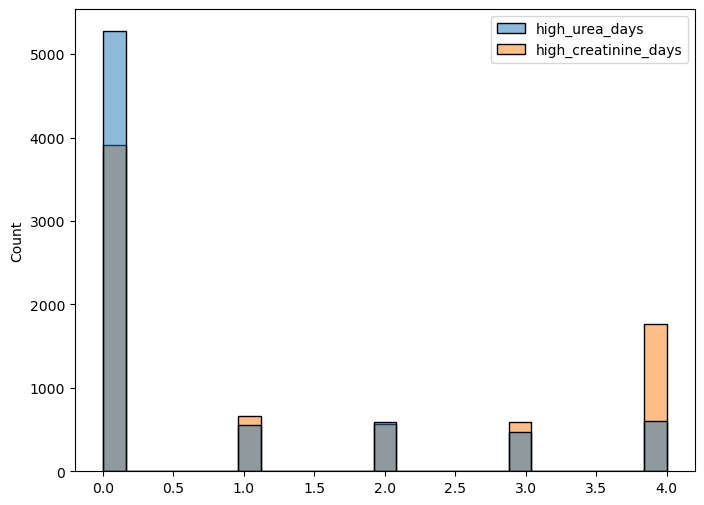

In [34]:
plt.figure(figsize = (8, 6))

sns.histplot(data = df_funcao_renal)

plt.show()

#### DATASET Dieta Grupos

/home/igorsantana/anaconda3/envs/.petca-venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


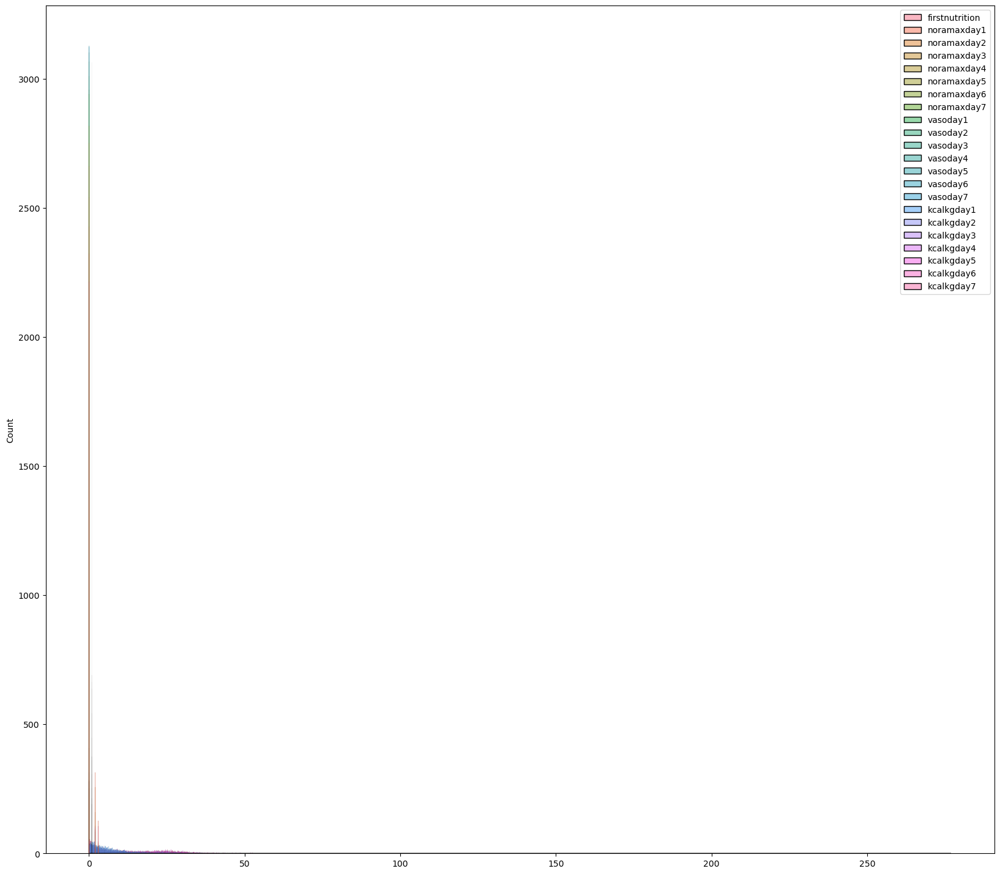

In [35]:
plt.figure(figsize = (20, 18))

sns.histplot(data = df_dieta_grupos)

plt.show()

#### DATASET Perfil Hepatico

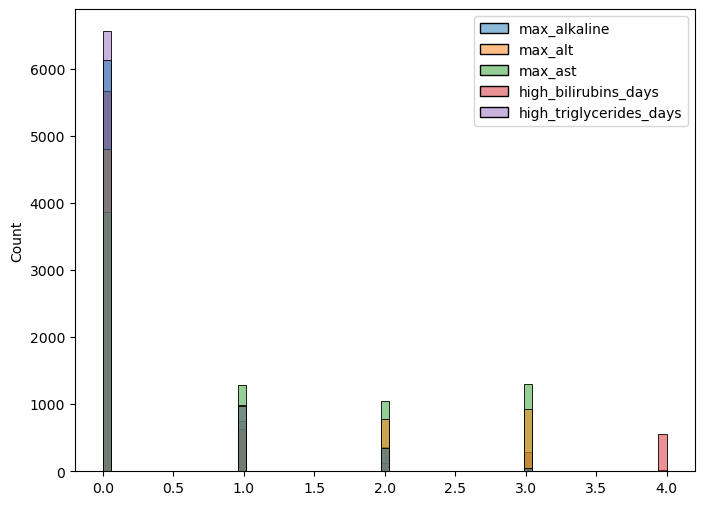

In [36]:
plt.figure(figsize = (8, 6))

sns.histplot(data = df_perfil_hepatico)

plt.show()

#### DATASET Ureia piviteado - 7 dias

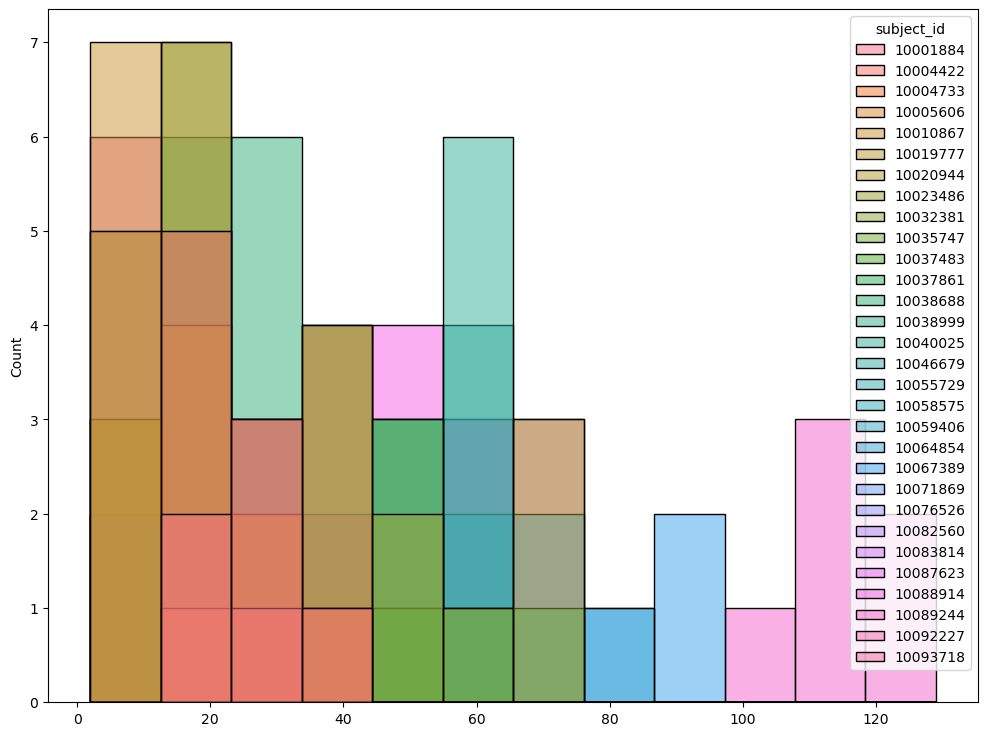

In [45]:
plt.figure(figsize = (12, 9))

sns.histplot(data = df_ureia_pivoteado_7_dias.iloc[0:30, :].T)

plt.show()

#### DATASET Creatinina piviteado - 7 dias

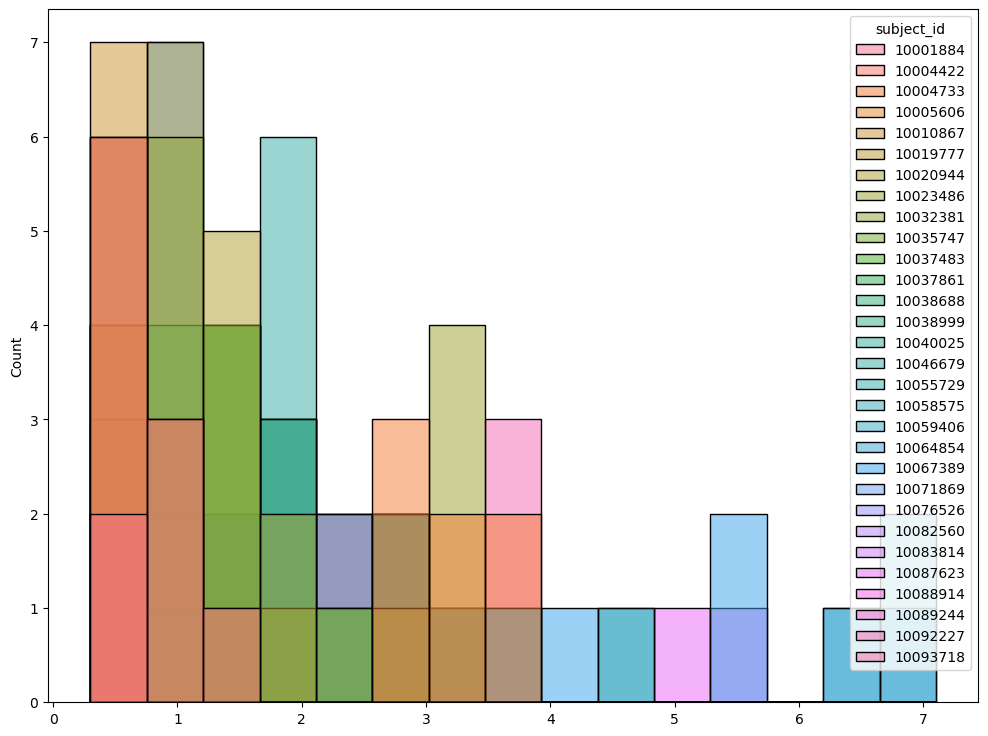

In [44]:
plt.figure(figsize = (12, 9))

sns.histplot(data = df_creatinina_pivoteado_7_dias.iloc[0:30, :].T)

plt.show()

### BoxPlot

#### DATASET Funcao Renal

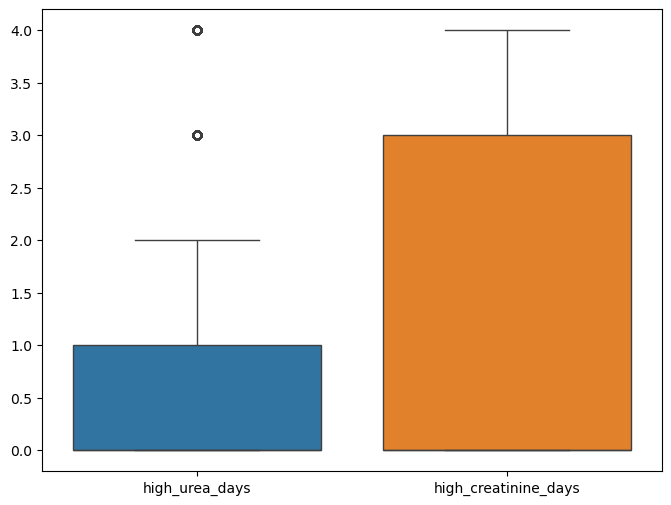

In [15]:
plt.figure(figsize = (8, 6))

sns.boxplot(data = df_funcao_renal)

plt.show()

Como podemos ver acima, a enorme maioria dos dados, em ambas colunas, está entre o primeiro e o segundo quartil.
A distribuição dos dados na coluna `high_urea_days` está muito mais aglutinada do que a coluna `high_creatine_days`.
Além disso, conseguimos notar que somente a coluna `high_urea_days` possui outliers.

#### DATASET Dieta Grupos

/tmp/ipykernel_5752/3523878036.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)


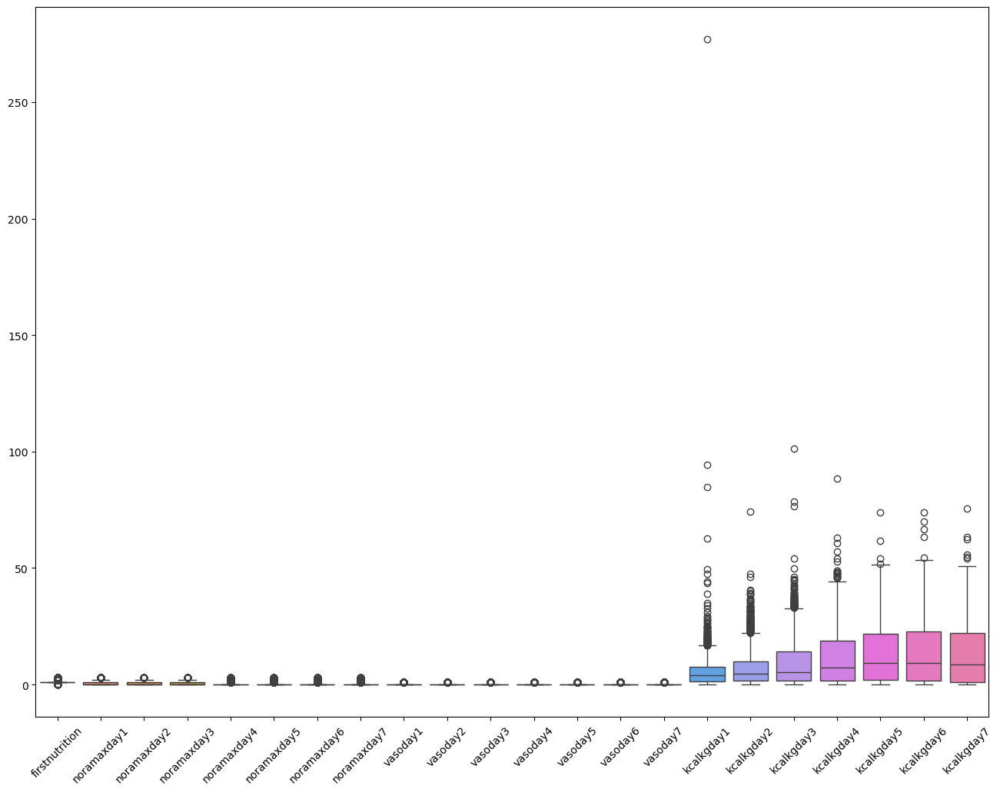

In [42]:
plt.figure(figsize = (16, 12))

boxplot = sns.boxplot(data = df_dieta_grupos)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Perfil Hepatico

/tmp/ipykernel_5752/3745875234.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)


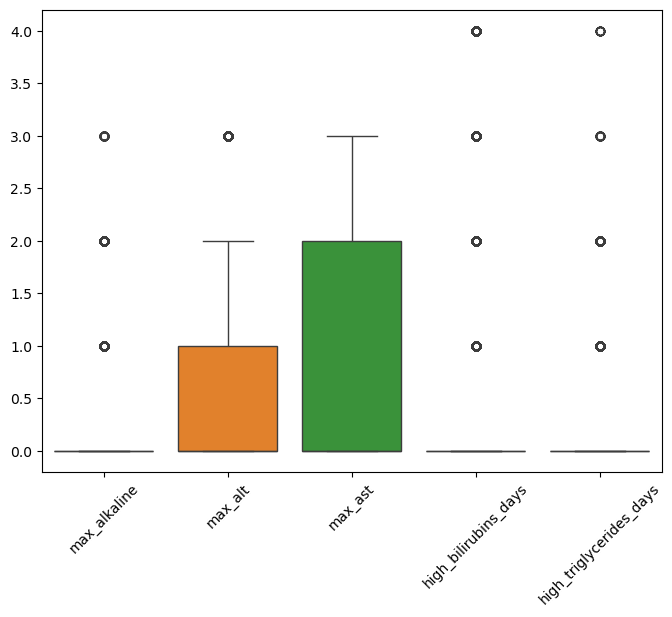

In [49]:
plt.figure(figsize = (8, 6))

boxplot = sns.boxplot(data = df_perfil_hepatico)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Ureia pivoteado - 7 dias

/tmp/ipykernel_5752/4277826055.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)


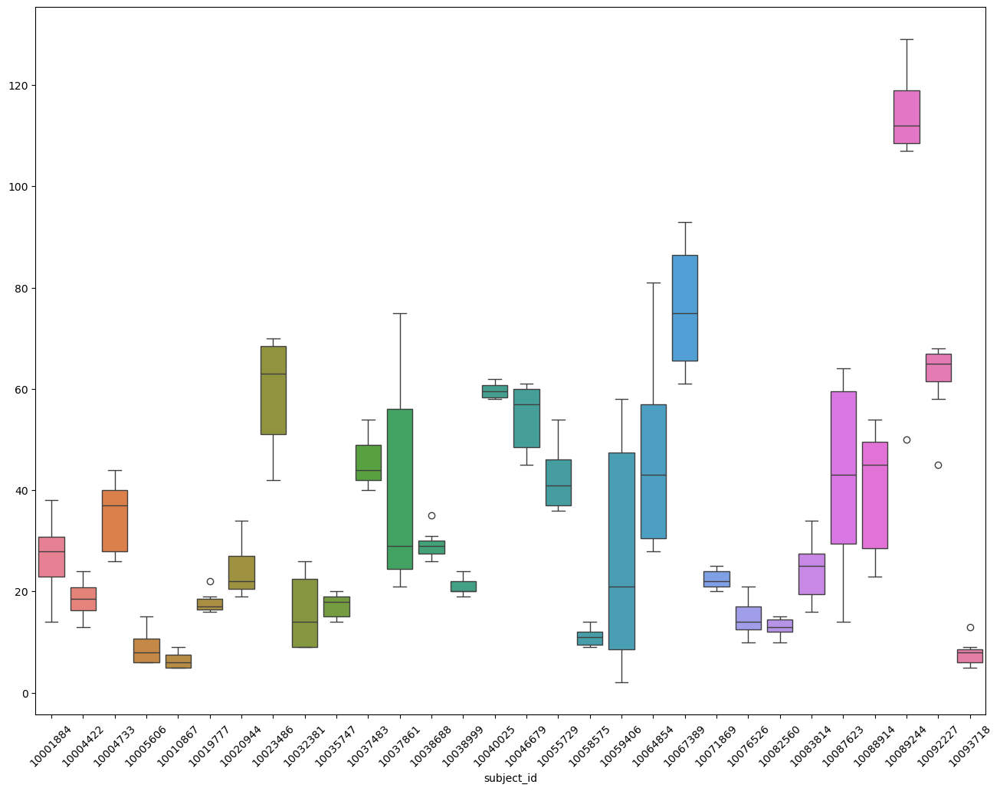

In [47]:
plt.figure(figsize = (16, 12))

boxplot = sns.boxplot(data = df_ureia_pivoteado_7_dias.iloc[0:30, :].T)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Creatinina pivoteado - 7 dias

/tmp/ipykernel_5752/458530808.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)


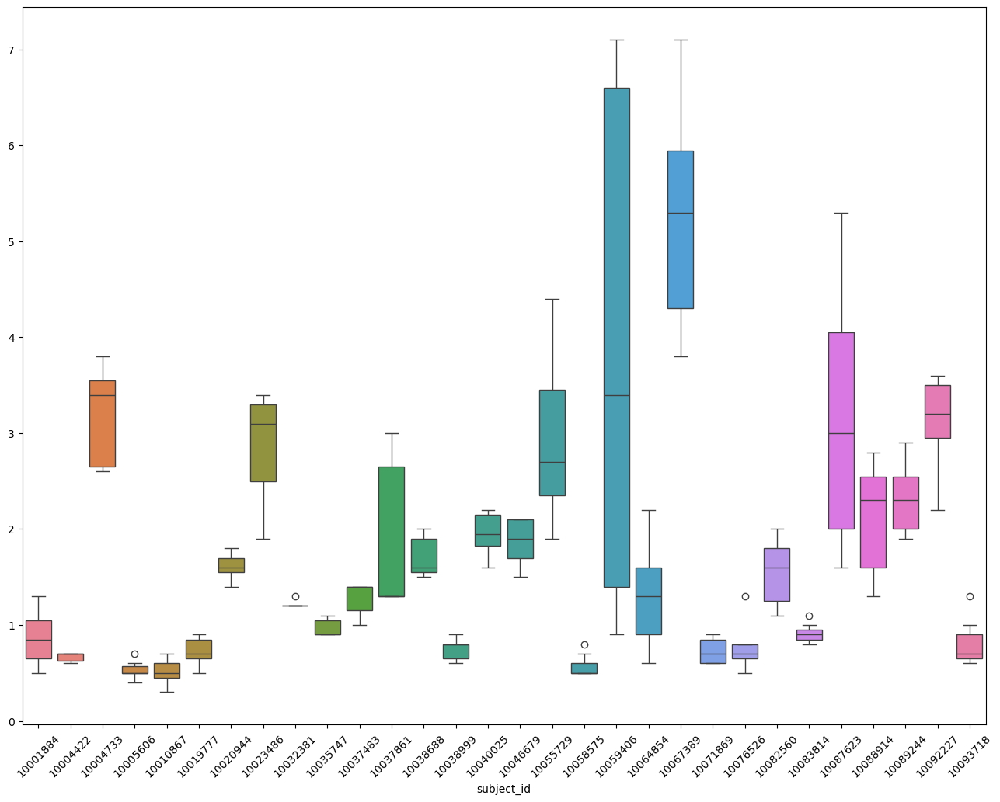

In [48]:
plt.figure(figsize = (16, 12))

boxplot = sns.boxplot(data = df_creatinina_pivoteado_7_dias.iloc[0:30, :].T)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation = 45)

plt.show()

### ViolinPlot

#### DATASET Funcao Renal

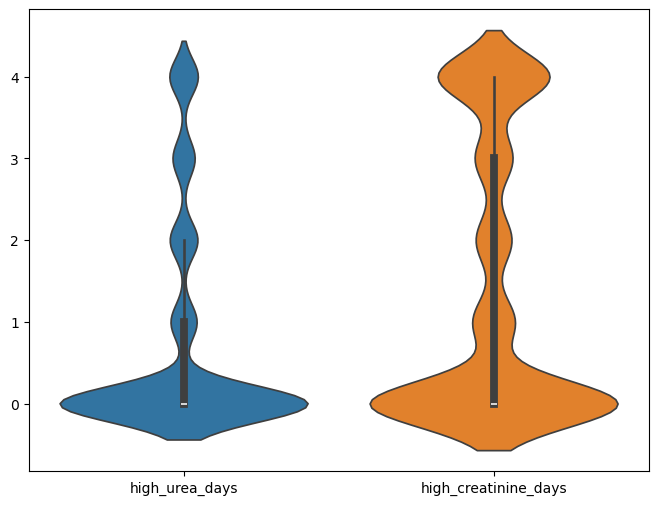

In [16]:
plt.figure(figsize = (8, 6))

sns.violinplot(data = df_funcao_renal)

plt.show()

Como podemos ver acima, a coluna `high_urea_days` tem sua concentração de dados entre o primeiro e o segundo quartil, com poucos dados expalhados acima de sua mediana.
Enquanto a coluna `high_creatine_days` possui duas concentrações de dados:
- entre o primeiro e o segundo quartil (onde grande parte de seus dados está);
- ao redor do terceiro quartil (há uma segunda concentração).

#### DATASET Dieta Grupos

/tmp/ipykernel_5752/1320004938.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)


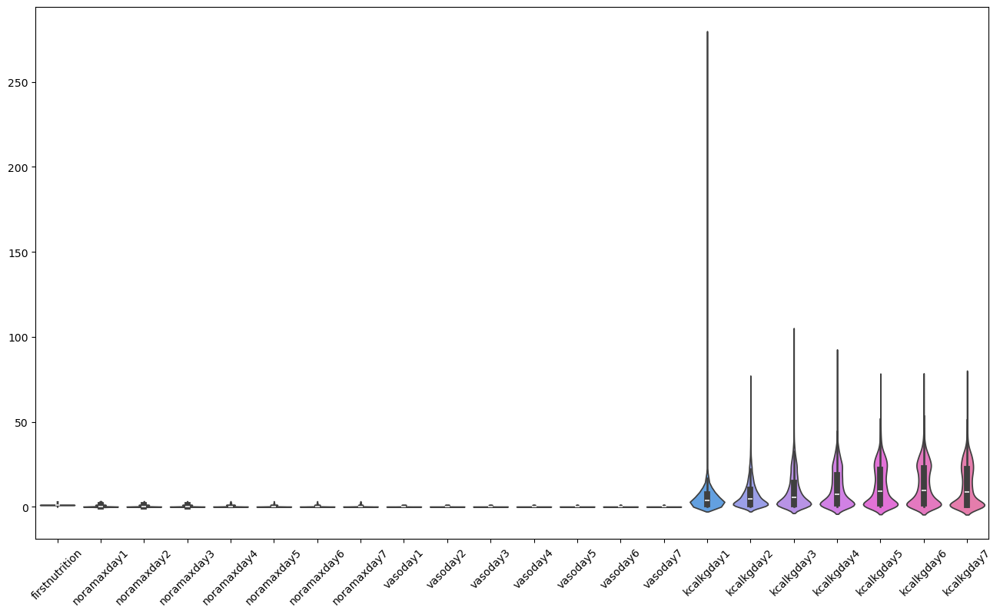

In [51]:
plt.figure(figsize = (16, 9))

violinplot = sns.violinplot(data = df_dieta_grupos)
violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Perfil Hepatico

/tmp/ipykernel_5752/958757352.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)


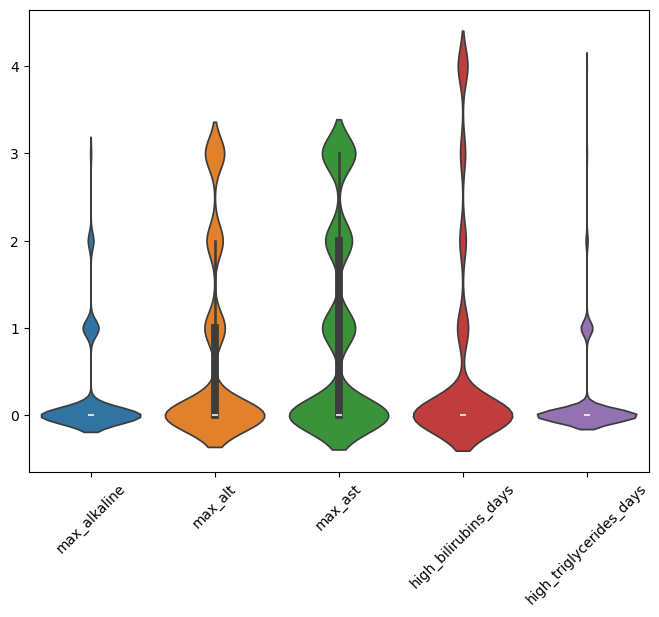

In [53]:
plt.figure(figsize = (8, 6))

violinplot = sns.violinplot(data = df_perfil_hepatico)
violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Ureia pivoteado - 7 dias

/tmp/ipykernel_5752/2577069129.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)


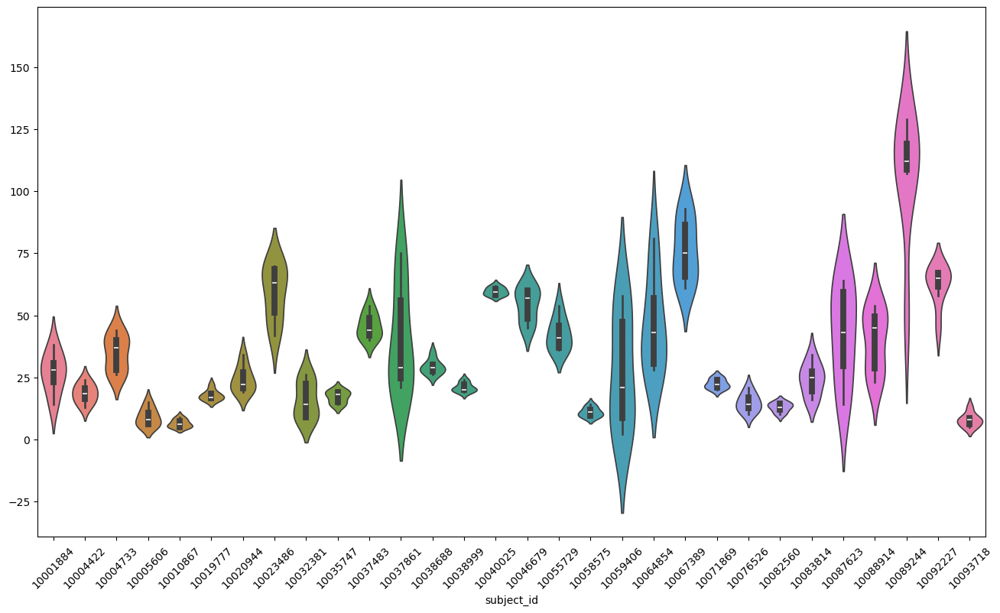

In [54]:
plt.figure(figsize = (16, 9))

violinplot = sns.violinplot(data = df_ureia_pivoteado_7_dias.iloc[0:30, :].T)
violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)

plt.show()

#### DATASET Creatinina pivoteado - 7 dias

/tmp/ipykernel_5752/2871050689.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)


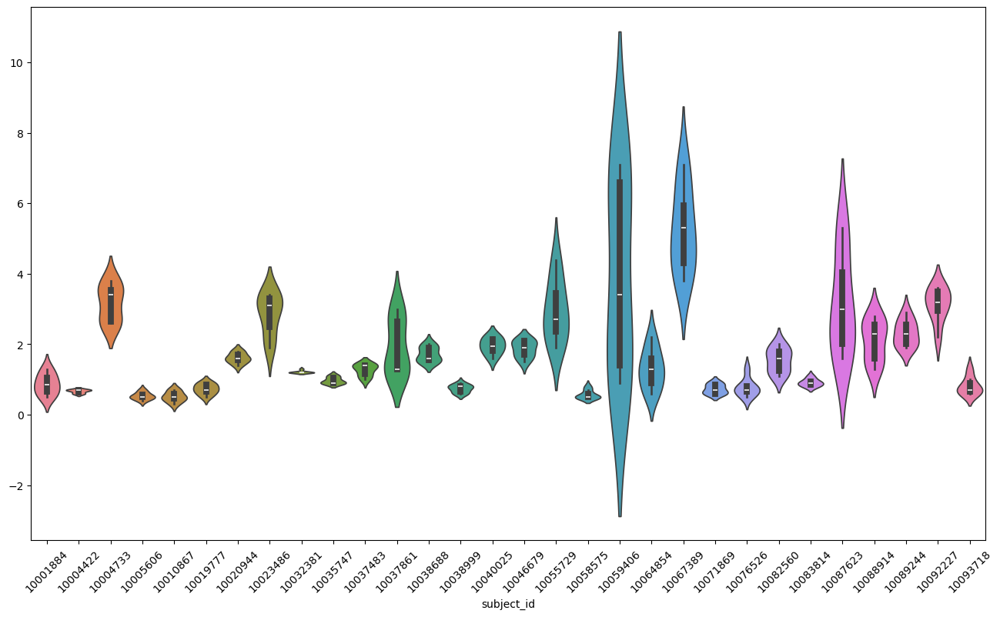

In [55]:
plt.figure(figsize = (16, 9))

violinplot = sns.violinplot(data = df_creatinina_pivoteado_7_dias.iloc[0:30, :].T)
violinplot.set_xticklabels(violinplot.get_xticklabels(), rotation = 45)

plt.show()

### Grafico de dispersao

#### DATASET Funcao Renal

<Figure size 1200x900 with 0 Axes>

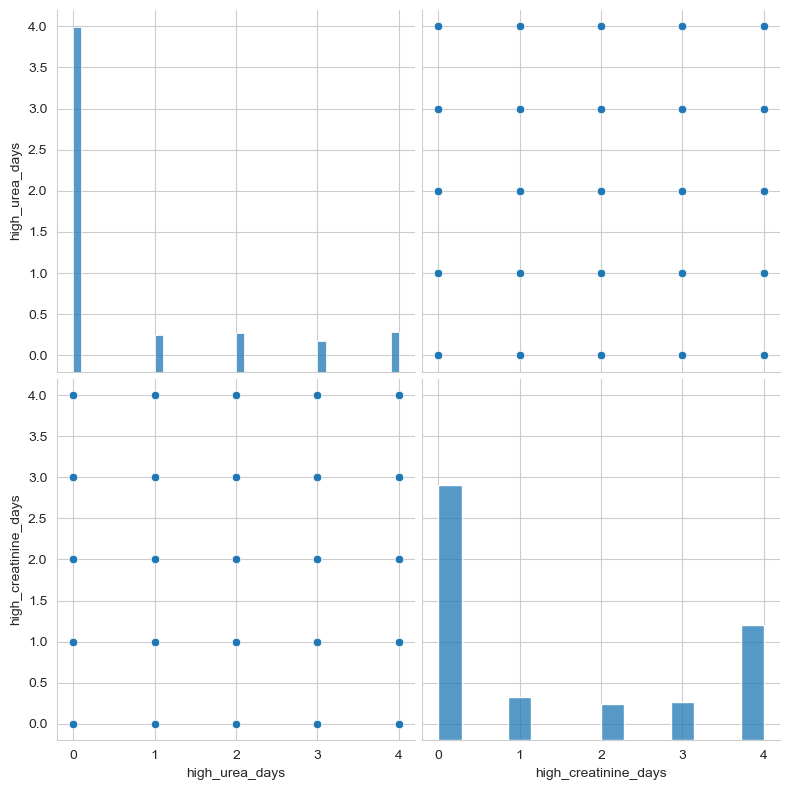

In [17]:
plt.figure(figsize = (12, 9))

sns.set_style("whitegrid")
sns.pairplot(df_funcao_renal,  height = 4)

plt.show()

#### DATASET Dieta Grupos

<Figure size 1200x900 with 0 Axes>

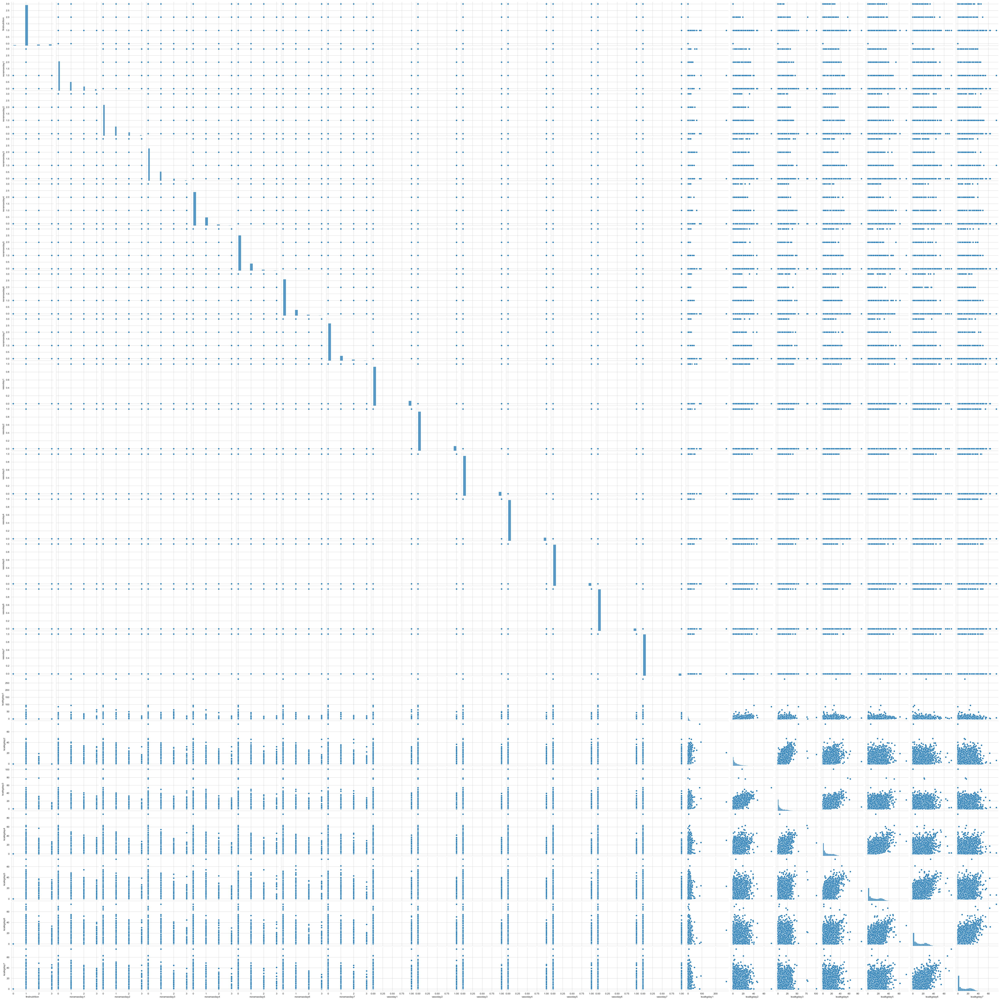

In [57]:
plt.figure(figsize = (12, 9))

sns.set_style("whitegrid")
sns.pairplot(df_dieta_grupos)

plt.show()

#### DATASET Perfil Hepatico

<Figure size 800x600 with 0 Axes>

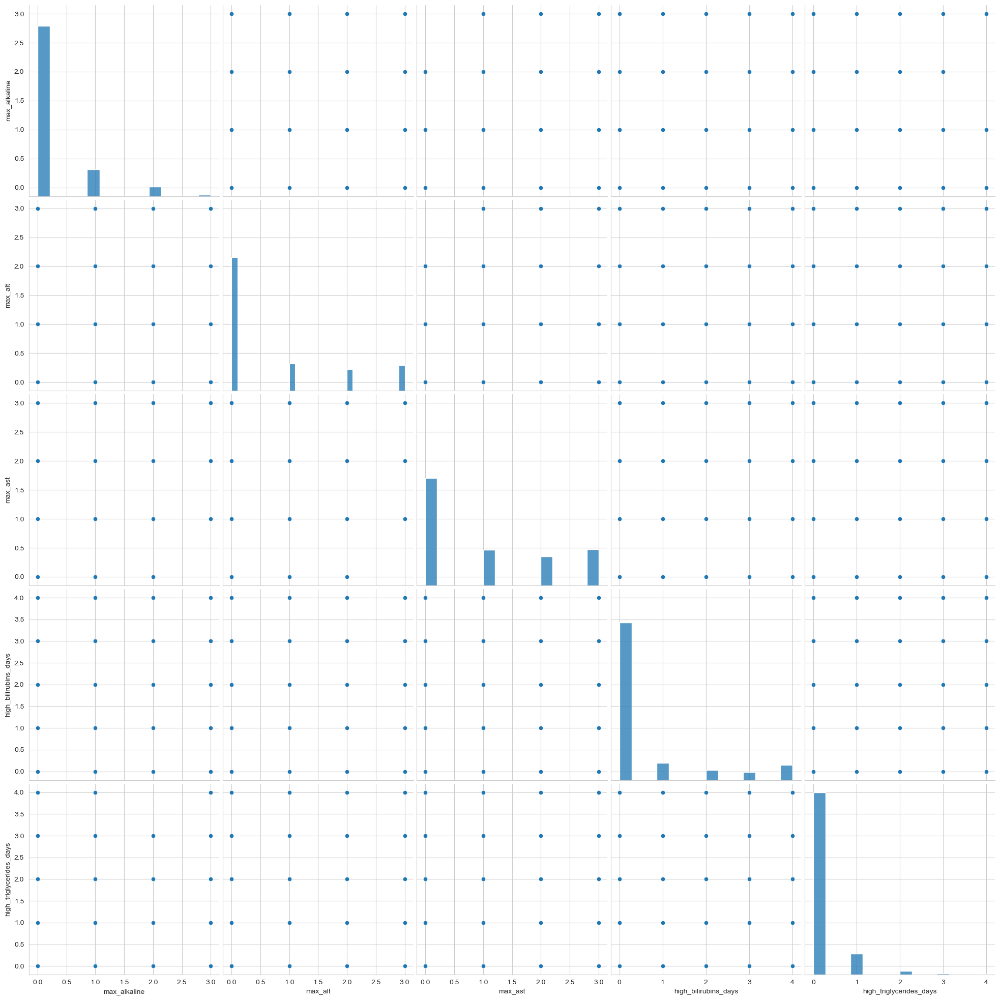

In [58]:
plt.figure(figsize = (8, 6))

sns.set_style("whitegrid")
sns.pairplot(df_perfil_hepatico, height = 4)

plt.show()

#### DATASET Ureia pivoteado - 7 dias

<Figure size 800x600 with 0 Axes>

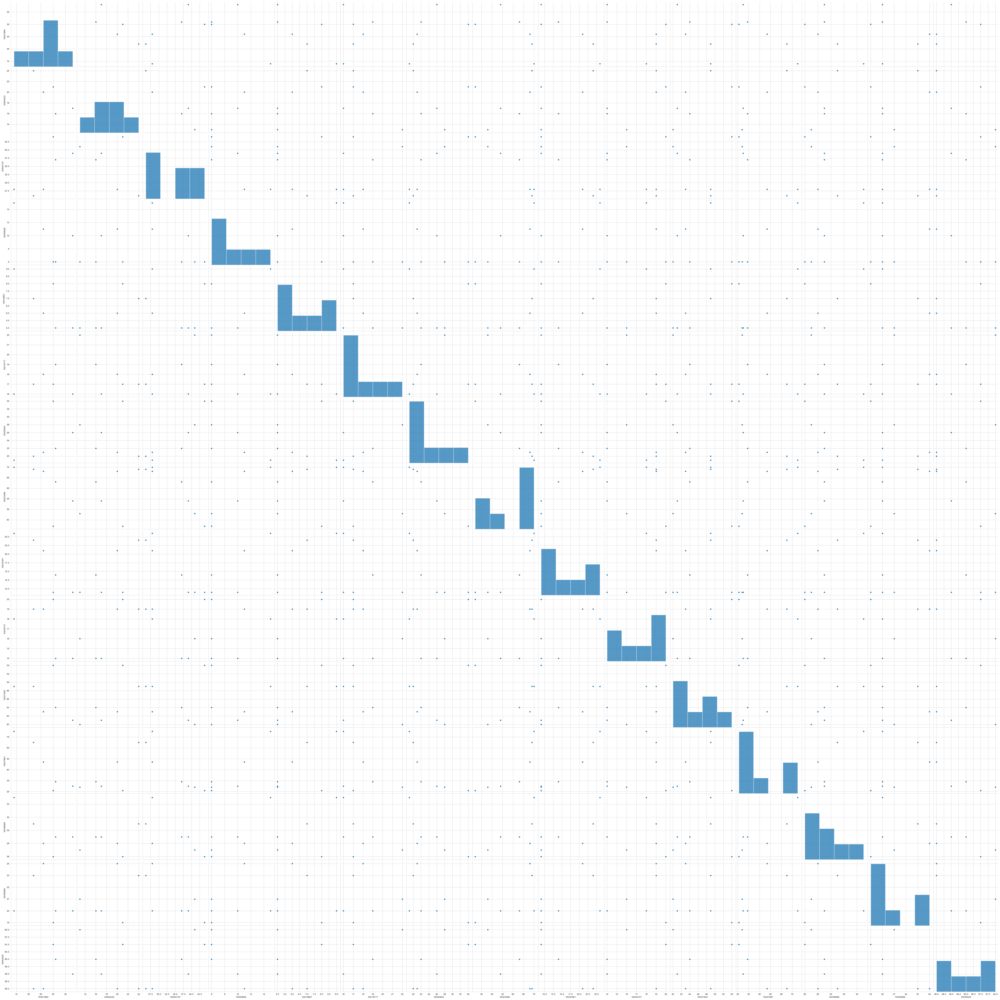

In [60]:
plt.figure(figsize = (8, 6))

sns.set_style("whitegrid")
sns.pairplot(df_ureia_pivoteado_7_dias.iloc[0:15, :].T, height = 4)

plt.show()

#### DATASET Creatinina pivoteado - 7 dias

<Figure size 800x600 with 0 Axes>

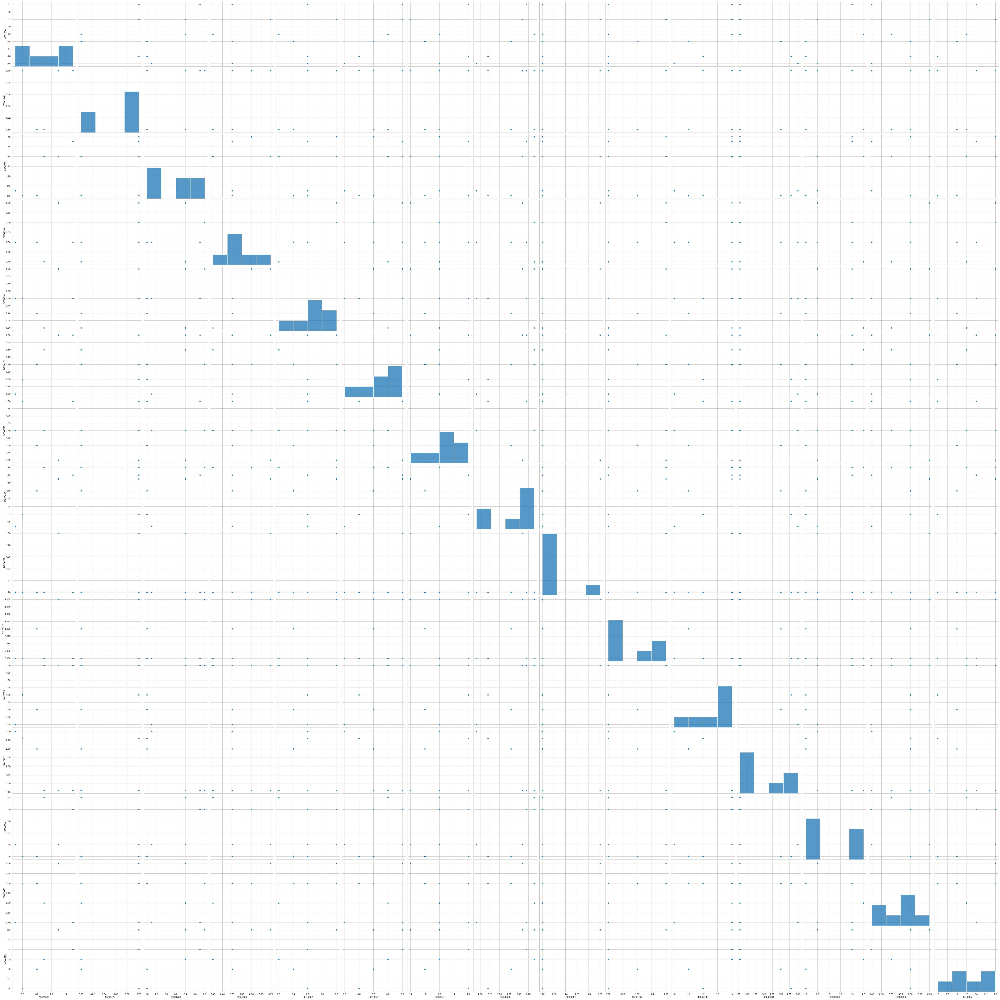

In [61]:
plt.figure(figsize = (8, 6))

sns.set_style("whitegrid")
sns.pairplot(df_creatinina_pivoteado_7_dias.iloc[0:15, :].T, height = 4)

plt.show()

### Mapa de Calor

#### DATASET Funcao Renal

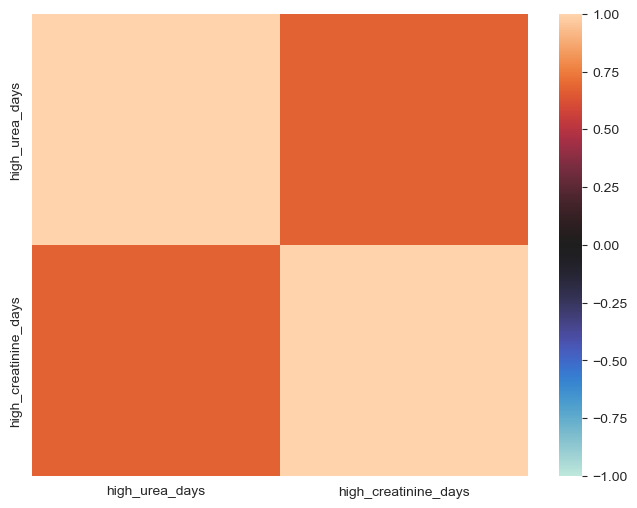

In [18]:
plt.figure(figsize = (8, 6))

sns.heatmap(data = df_funcao_renal.corr(), vmin = -1, vmax = 1, center = 0)

plt.show()

Como podemos ver acima, ambas colunas são positivamente relacionadas.

#### DATASET Dieta Grupos

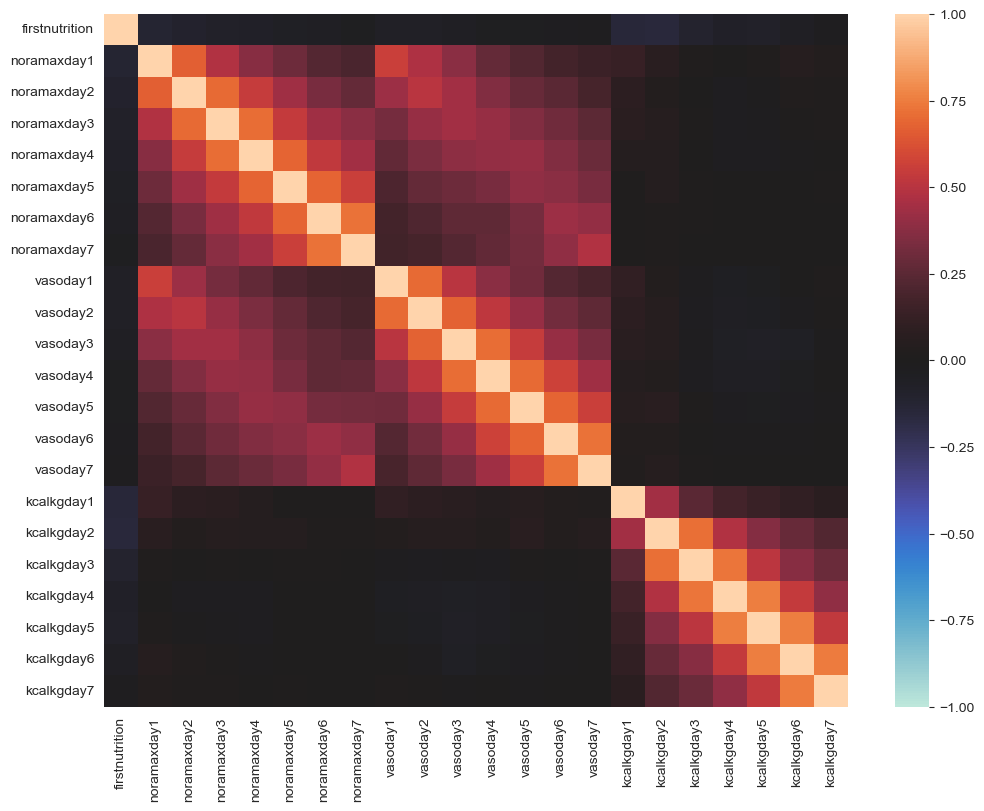

In [65]:
plt.figure(figsize = (12, 9))

sns.heatmap(data = df_dieta_grupos.corr(), vmin = -1, vmax = 1, center = 0)

plt.show()

#### DATASET Perfil Hepatico

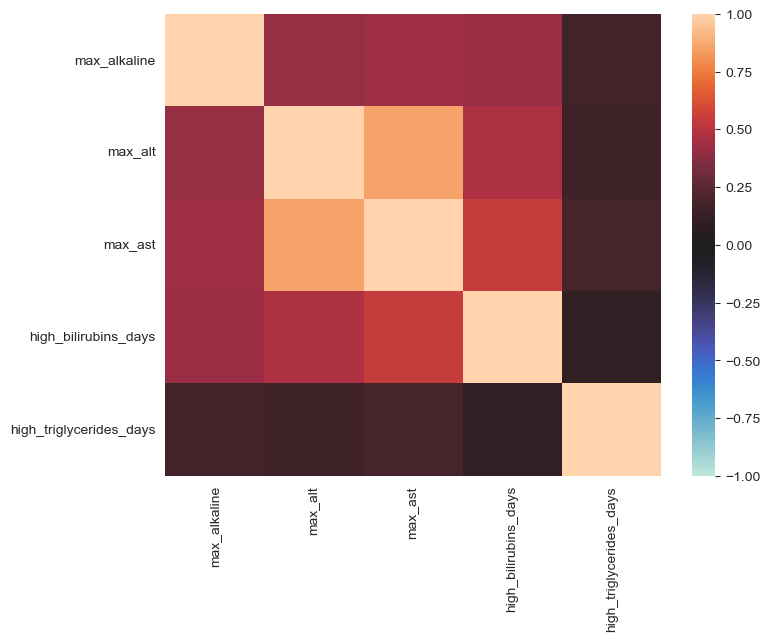

In [ ]:
plt.figure(figsize = (8, 6))

sns.heatmap(data = df_perfil_hepatico.corr(), vmin = -1, vmax = 1, center = 0)

plt.show()

#### DATASET Ureia pivoteado - 7 dias

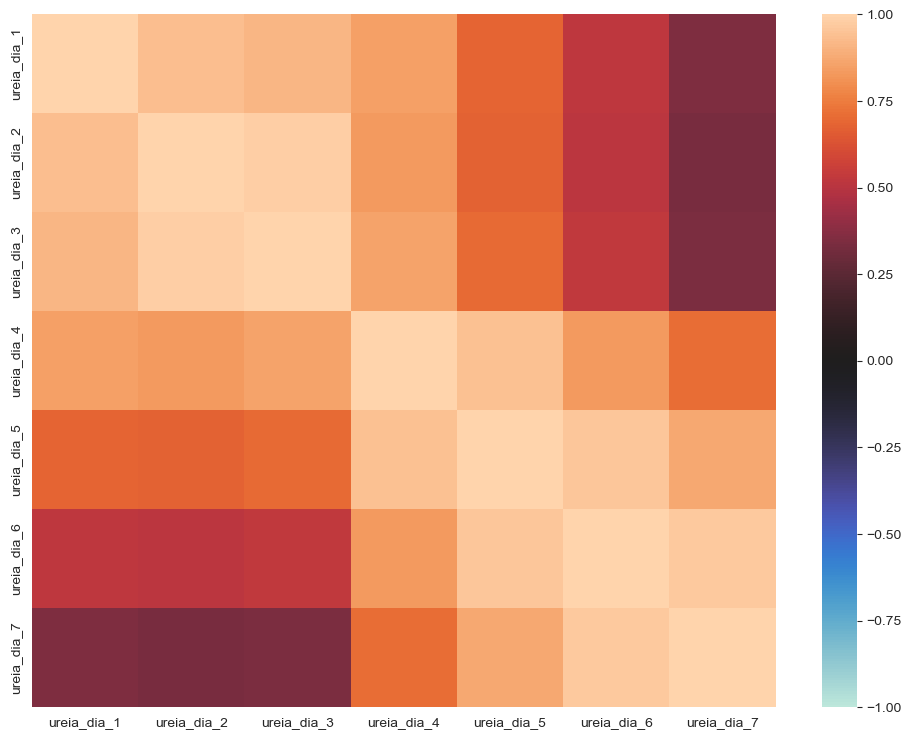

In [68]:
plt.figure(figsize = (12, 9))

sns.heatmap(data = df_ureia_pivoteado_7_dias.iloc[0:20, :].corr(), vmin = -1, vmax = 1, center = 0)

plt.show()

#### DATASET Creatinina pivoteado - 7 dias

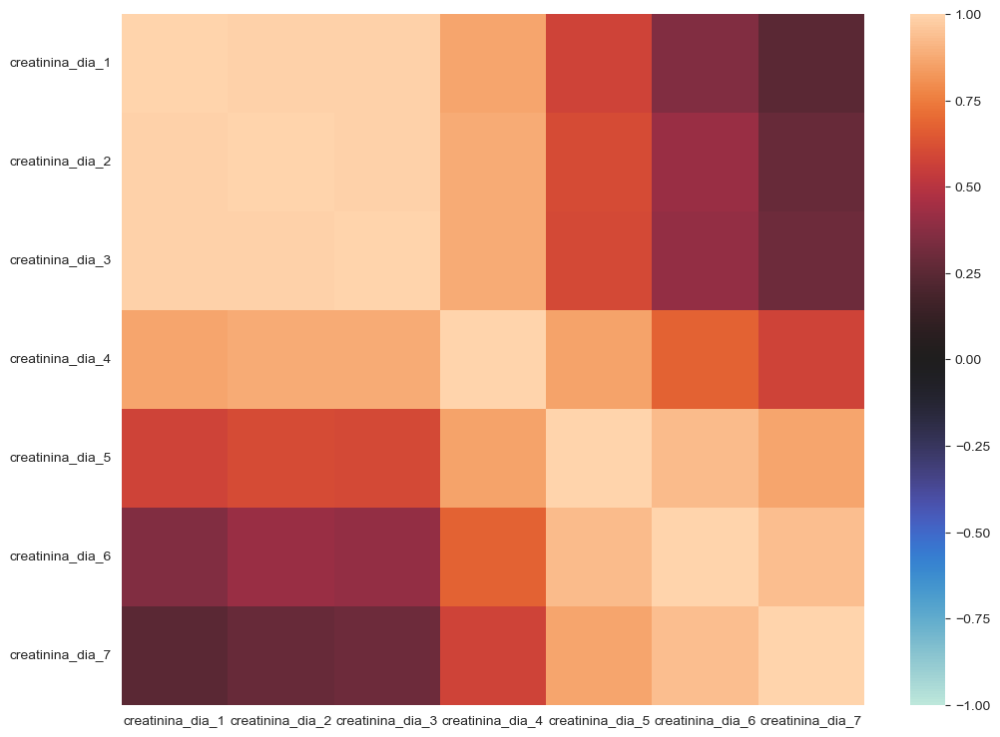

In [ ]:
plt.figure(figsize = (12, 9))

sns.heatmap(data = df_creatinina_pivoteado_7_dias.iloc[0:20, :].corr(), vmin = -1, vmax = 1, center = 0)

plt.show()

## Teste de Mann-Kendall

### DATASET Ureia pivoteado - 7 dias

#### Sem deleção de dados faltantes & dados outliers

##### Por paciente

In [4]:
df_pivoteado = df_ureia_pivoteado_7_dias.T
for paciente in df_pivoteado.columns:
    print(f"""
    ID paciente: {paciente}
    Sumário teste de Mann-Kendall:
    {mk.original_test(df_pivoteado[paciente])}
    """)
    print("=" * 50)


    ID paciente: 10001884
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.060289173990602185, z=-1.8786728732554487, Tau=-0.7333333333333333, s=-11.0, var_s=28.333333333333332, slope=-5.0, intercept=45.5)
    

    ID paciente: 10004422
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.4523703606773608, z=0.7514691493021795, Tau=0.3333333333333333, s=5.0, var_s=28.333333333333332, slope=1.5, intercept=14.75)
    

    ID paciente: 10004733
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='decreasing', h=True, p=0.009809151645794323, z=-2.58248538606335, Tau=-0.8571428571428571, s=-18.0, var_s=43.333333333333336, slope=-2.75, intercept=45.25)
    

    ID paciente: 10005606
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.06996744829844559, z=1.8121213490778656, Tau=0.6666666666666666, s=10.0, var_s=24.666666666666668, slope=1.5, intercept=4.25)
    

    I

ZeroDivisionError: float division by zero

##### Por dia

In [3]:
for dia in df_ureia_pivoteado_7_dias.columns:
    dado_agrupado = df_ureia_pivoteado_7_dias[dia]

    print(f"""
    Dia: {dia[-1]}
    Sumário teste de Mann-Kendall:
    {mk.original_test(dado_agrupado)}
    """)
    print("=" * 50)


    Dia: 1
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.13562782001455176, z=-1.4922721294294212, Tau=-0.017329486058228868, s=-94159.0, var_s=3981240326.3333335, slope=0.0, intercept=22.0)
    

    Dia: 2
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.33804353533193554, z=-0.958038122738207, Tau=-0.011160033131348359, s=-59904.0, var_s=3909593135.3333335, slope=0.0, intercept=22.0)
    

    Dia: 3
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.22506341986318423, z=-1.2131736927689594, Tau=-0.014123817099188975, s=-75998.0, var_s=3924162010.0, slope=0.0, intercept=22.0)
    

    Dia: 4
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.16475779686243763, z=-1.3892465307671993, Tau=-0.016208776326796702, s=-86474.0, var_s=3874381751.3333335, slope=0.0, intercept=23.0)
    

    Dia: 5
    Sumário teste de Mann-Kendall:
    

#### Com deleção de dados nulos & outliers

##### Removendo valores outliers do dataset e os substituindo por `np.nan`

In [13]:
novo_df_ureia_tratado = deletar_valores_absurdos(df_ureia_pivoteado_7_dias, df_ureia_pivoteado_7_dias.max().max())
novo_df_ureia_tratado.max()

ureia_dia_1    212.0
ureia_dia_2    162.0
ureia_dia_3    171.0
ureia_dia_4    184.0
ureia_dia_5    182.0
ureia_dia_6    206.0
ureia_dia_7    195.0
dtype: float64

##### Iterando pelo dataset e inserindo dados de dias anteriores em dias posteriores que contém dados nulos

In [14]:
novo_df_ureia_tratado = preencher_valores_faltantes_linha(novo_df_ureia_tratado)
novo_df_ureia_tratado.head(10)

,ureia_dia_1,ureia_dia_2,ureia_dia_3,ureia_dia_4,ureia_dia_5,ureia_dia_6,ureia_dia_7
subject_id,,,,,,,
10001884,30.0,30.0,38.0,31.0,26.0,22.0,14.0
10004422,21.0,13.0,17.0,16.0,20.0,24.0,24.0
10004733,44.0,41.0,39.0,37.0,28.0,26.0,28.0
10005606,6.0,6.0,10.0,6.0,11.0,11.0,15.0
10010867,8.0,5.0,5.0,5.0,6.0,7.0,9.0
10019777,17.0,22.0,16.0,19.0,18.0,17.0,16.0
10020944,34.0,28.0,26.0,22.0,21.0,20.0,19.0
10023486,42.0,48.0,54.0,63.0,68.0,69.0,70.0
10032381,9.0,9.0,9.0,14.0,21.0,24.0,26.0


In [15]:
novo_df_ureia_tratado.isna().sum()

ureia_dia_1    21
ureia_dia_2     2
ureia_dia_3     5
ureia_dia_4     5
ureia_dia_5     7
ureia_dia_6    12
ureia_dia_7    32
dtype: int64

##### Deletando linhas que contém valores nulos - mesmo depois da inserção de dados artificiais

In [16]:
novo_df_ureia_tratado[novo_df_ureia_tratado.isna().any(axis = 1)].index

Index([10344732, 10463546, 10477920, 10553635, 10583686, 10615339, 10996857,
       11542534, 11611745, 11638303, 11663336, 11833476, 12344021, 12374214,
       12606435, 12934260, 13679248, 13681485, 13824877, 13827765, 13911200,
       14363068, 14383658, 14623418, 14691603, 14696918, 14785854, 14816630,
       15090519, 15158294, 15204620, 15409850, 15455733, 15583807, 15640315,
       15763754, 15993533, 16327028, 16832227, 17131210, 17327554, 17484283,
       17635990, 17718694, 17803326, 18135694, 18152377, 18213765, 18560897,
       18638524, 18757959, 18976063, 19392949, 19571102, 19571265, 19694231],
      dtype='int64', name='subject_id')

In [17]:
novo_df_ureia_tratado = novo_df_ureia_tratado.dropna(axis = 0)
novo_df_ureia_tratado.isna().sum().sum()

0

##### Realizando teste

###### Por paciente

In [18]:
df_pivoteado = novo_df_ureia_tratado.T
for paciente in df_pivoteado.columns:
    print(f"""
    ID paciente: {paciente}
    Sumário teste de Mann-Kendall:
    {mk.original_test(df_pivoteado[paciente])}
    """)
    print("=" * 50)


    ID paciente: 10001884
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.09471773621506485, z=-1.6710199556880498, Tau=-0.5714285714285714, s=-12.0, var_s=43.333333333333336, slope=-3.2, intercept=39.6)
    

    ID paciente: 10004422
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.17156320646337742, z=1.3671981455629498, Tau=0.47619047619047616, s=10.0, var_s=43.333333333333336, slope=1.75, intercept=14.75)
    

    ID paciente: 10004733
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='decreasing', h=True, p=0.009809151645794323, z=-2.58248538606335, Tau=-0.8571428571428571, s=-18.0, var_s=43.333333333333336, slope=-2.75, intercept=45.25)
    

    ID paciente: 10005606
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='increasing', h=True, p=0.02622418134873805, z=2.2228757209048453, Tau=0.7142857142857143, s=15.0, var_s=39.666666666666664, slope=1.25, intercept=6.25)
    



###### Por dia

In [17]:
for dia in novo_df_ureia_tratado:
    dado_agrupado = novo_df_ureia_tratado[dia]

    print(f"""
    Dia: {dia[-1]}
    Sumário teste de Mann-Kendall:
    {mk.original_test(dado_agrupado)}
    """)
    print("=" * 50)


    Dia: 1
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.11625357480012122, z=-1.5706947261397308, Tau=-0.018346323756416334, s=-97399.0, var_s=3845178515.0, slope=0.0, intercept=22.0)
    

    Dia: 2
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.2841789085345563, z=-1.0709789190921983, Tau=-0.012510098587073696, s=-66415.0, var_s=3845540866.3333335, slope=0.0, intercept=22.0)
    

    Dia: 3
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.17835636246667175, z=-1.3458330552403481, Tau=-0.0157211149329872, s=-83462.0, var_s=3845783096.0, slope=0.0, intercept=22.0)
    

    Dia: 4
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.15009709492200352, z=-1.4391885982939554, Tau=-0.01681211080765905, s=-89254.0, var_s=3846008377.3333335, slope=0.0, intercept=23.0)
    

    Dia: 5
    Sumário teste de Mann-Kendall:
    Mann_Kend

### DATASET Creatinina pivoteado - 7 dias

#### Sem deleção de dados faltantes & dados outliers

##### Por paciente

In [5]:
df_pivoteado = df_creatinina_pivoteado_7_dias.T
for paciente in df_pivoteado.columns:
    print(f"""
    ID paciente: {paciente}
    Sumário teste de Mann-Kendall:
    {mk.original_test(df_pivoteado[paciente])}
    """)
    print("=" * 50)


    ID paciente: 10001884
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='decreasing', h=True, p=0.024170547174545254, z=-2.2544074479065386, Tau=-0.8666666666666667, s=-13.0, var_s=28.333333333333332, slope=-0.13333333333333333, intercept=1.3166666666666669)
    

    ID paciente: 10004422
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.48745329036403495, z=-0.6943650748294136, Tau=-0.26666666666666666, s=-4.0, var_s=18.666666666666668, slope=0.0, intercept=0.7)
    

    ID paciente: 10004733
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.12430639675215227, z=-1.5369465587356799, Tau=-0.5238095238095238, s=-11.0, var_s=42.333333333333336, slope=-0.19999999999999996, intercept=4.0)
    

    ID paciente: 10005606
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.1587087334157915, z=-1.409427715949451, Tau=-0.5333333333333333, s=-8.0, var_s=24.66666666

ZeroDivisionError: float division by zero

##### Por dia

In [18]:
for dia in df_creatinina_pivoteado_7_dias:
    dado_agrupado = df_creatinina_pivoteado_7_dias[dia]

    print(f"""
    Dia: {dia[-1]}
    Sumário teste de Mann-Kendall:
    {mk.original_test(dado_agrupado)}
    """)
    print("=" * 50)


    Dia: 1
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.21205543757124135, z=-1.2479334282442174, Tau=-0.014470217793598495, s=-78671.0, var_s=3974069553.6666665, slope=0.0, intercept=1.1)
    

    Dia: 2
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.6249438093611839, z=-0.48885577251535367, Tau=-0.005688491795175498, s=-30497.0, var_s=3891564763.0, slope=0.0, intercept=1.1)
    

    Dia: 3
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.4207021834696745, z=-0.8052036275949905, Tau=-0.0093588164159015, s=-50389.0, var_s=3916001015.6666665, slope=0.0, intercept=1.0)
    

    Dia: 4
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.3715864151989112, z=-0.8935057108952348, Tau=-0.010408225962420695, s=-55528.0, var_s=3862013210.0, slope=0.0, intercept=1.0)
    

    Dia: 5
    Sumário teste de Mann-Kendall:
    Mann_Kendall_

#### Com deleção de dados nulos & outliers

##### Removendo valores outliers do dataset e os substituindo por `np.nan`

In [7]:
novo_df_creatinina_tratado = deletar_valores_absurdos(df_creatinina_pivoteado_7_dias, df_creatinina_pivoteado_7_dias.max().max())
novo_df_creatinina_tratado.max()

creatinina_dia_1    117.0
creatinina_dia_2     16.0
creatinina_dia_3     15.0
creatinina_dia_4     14.6
creatinina_dia_5     14.7
creatinina_dia_6     15.2
creatinina_dia_7     15.6
dtype: float64

##### Iterando pelo dataset e inserindo dados de dias anteriores em dias posteriores que contém dados nulos

In [8]:
novo_df_creatinina_tratado = preencher_valores_faltantes_linha(novo_df_creatinina_tratado)
novo_df_creatinina_tratado.head(10)

,creatinina_dia_1,creatinina_dia_2,creatinina_dia_3,creatinina_dia_4,creatinina_dia_5,creatinina_dia_6,creatinina_dia_7
subject_id,,,,,,,
10001884,1.1,1.1,1.3,0.9,0.8,0.6,0.5
10004422,0.7,0.7,0.7,0.6,0.6,0.7,0.7
10004733,3.4,3.8,3.7,3.4,2.6,2.6,2.7
10005606,0.7,0.6,0.5,0.4,0.5,0.5,0.5
10010867,0.7,0.7,0.5,0.3,0.4,0.5,0.5
10019777,0.9,0.7,0.9,0.8,0.7,0.6,0.5
10020944,1.4,1.6,1.8,1.6,1.5,1.8,1.6
10023486,3.1,3.4,3.2,3.4,2.8,2.2,1.9
10032381,1.3,1.2,1.2,1.2,1.2,1.2,1.2


In [9]:
novo_df_creatinina_tratado.isna().sum()

creatinina_dia_1    17
creatinina_dia_2     2
creatinina_dia_3     5
creatinina_dia_4     5
creatinina_dia_5     7
creatinina_dia_6    12
creatinina_dia_7    33
dtype: int64

##### Deletando linhas que contém valores nulos - mesmo depois da inserção de dados artificiais

In [10]:
novo_df_creatinina_tratado[novo_df_creatinina_tratado.isna().any(axis = 1)].index

Index([10344732, 10463546, 10477920, 10553635, 10615339, 10996857, 11542534,
       11611745, 11638303, 11663336, 11833476, 12344021, 12374214, 12606435,
       12917345, 12934260, 13679248, 13681485, 13824877, 13827765, 13911200,
       14363068, 14383658, 14623418, 14691603, 14696918, 14785854, 14816630,
       15090519, 15158294, 15204620, 15409850, 15455733, 15583807, 15640315,
       15763754, 15993533, 16327028, 16832227, 17131210, 17327554, 17484283,
       17635990, 17718694, 17803326, 18135694, 18152377, 18560897, 18638524,
       18757959, 19571102, 19571265, 19694231],
      dtype='int64', name='subject_id')

In [11]:
novo_df_creatinina_tratado = novo_df_creatinina_tratado.dropna(axis = 0)
novo_df_creatinina_tratado.isna().sum().sum()

0

##### Realizando teste

###### Por paciente

In [12]:
df_pivoteado = novo_df_creatinina_tratado.T
for paciente in df_pivoteado.columns:
    print(f"""
    ID paciente: {paciente}
    Sumário teste de Mann-Kendall:
    {mk.original_test(df_pivoteado[paciente])}
    """)
    print("=" * 50)


    ID paciente: 10001884
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='decreasing', h=True, p=0.022687071535486103, z=-2.27866357593825, Tau=-0.7619047619047619, s=-16.0, var_s=43.333333333333336, slope=-0.10000000000000003, intercept=1.2000000000000002)
    

    ID paciente: 10004422
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.8464505968765905, z=-0.19364916731037085, Tau=-0.09523809523809523, s=-2.0, var_s=26.666666666666668, slope=0.0, intercept=0.7)
    

    ID paciente: 10004733
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.12430639675215227, z=-1.5369465587356799, Tau=-0.5238095238095238, s=-11.0, var_s=42.333333333333336, slope=-0.19999999999999996, intercept=4.0)
    

    ID paciente: 10005606
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.1803918924787946, z=-1.3395493732462742, Tau=-0.42857142857142855, s=-9.0, var_s=35.66666666

###### Por dia

In [24]:
for dia in novo_df_creatinina_tratado:
    dado_agrupado = novo_df_creatinina_tratado[dia]

    print(f"""
    Dia: {dia[-1]}
    Sumário teste de Mann-Kendall:
    {mk.original_test(dado_agrupado)}
    """)
    print("=" * 50)


    Dia: 1
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.20107348195179808, z=-1.2784991566115516, Tau=-0.014906487329307154, s=-79283.0, var_s=3845460041.0, slope=0.0, intercept=1.1)
    

    Dia: 2
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.46742033498021884, z=-0.7266827304878639, Tau=-0.008472761436977632, s=-45064.0, var_s=3845479698.6666665, slope=0.0, intercept=1.1)
    

    Dia: 3
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.3004988856342081, z=-1.0353641409827332, Tau=-0.012071015217842134, s=-64202.0, var_s=3845008874.6666665, slope=0.0, intercept=1.0)
    

    Dia: 4
    Sumário teste de Mann-Kendall:
    Mann_Kendall_Test(trend='no trend', h=False, p=0.3313642701631263, z=-0.9713695820566377, Tau=-0.011324026908124575, s=-60229.0, var_s=3844393941.6666665, slope=0.0, intercept=1.0)
    

    Dia: 5
    Sumário teste de Mann-Kendall:
    Mann_